# Detecting Moving Cars in a Video file using OpenCV

I have issues installing OpenCV in my local machine, therefore, I have executed this project in Google CoLab, and for output I have displayed every 50th frame of the video showing object detection.

In [ ]:
#uploading the required file to Colab
from google.colab import files

uploaded = files.upload()

Saving cars.xml to cars.xml
Saving Ice Car.mp4 to Ice Car.mp4


In [5]:
#import OpenCV
import cv2
from google.colab.patches import cv2_imshow

In [6]:
#loading the trained model from cars.xml file
cars_cascade = cv2.CascadeClassifier('/content/cars.xml')

In [7]:
#using detectMultiScale() method to detect and get the coordinates of the vehicles in video frames.
#we will use cv2.rectangle() method to draw a rectangle around every detected car using diagonal coordinate points returned by our cascade classifier.
def detect_cars(frame):
  cars = cars_cascade.detectMultiScale(frame, 1.15, 4)
  for (x, y, w, h) in cars:
    cv2.rectangle(frame, (x, y), (x+w, y+h), color=(0, 255, 0), thickness=2)
  return frame

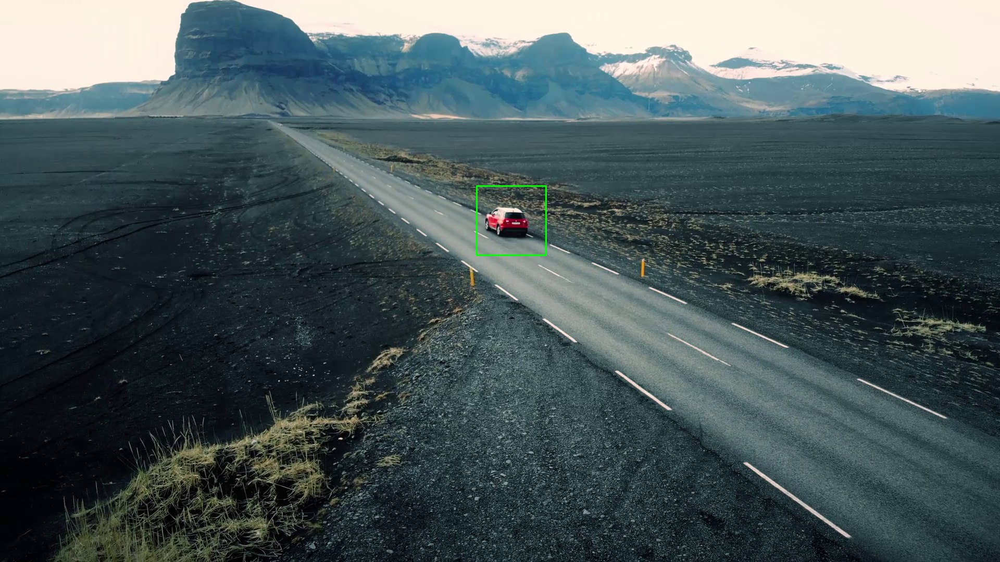

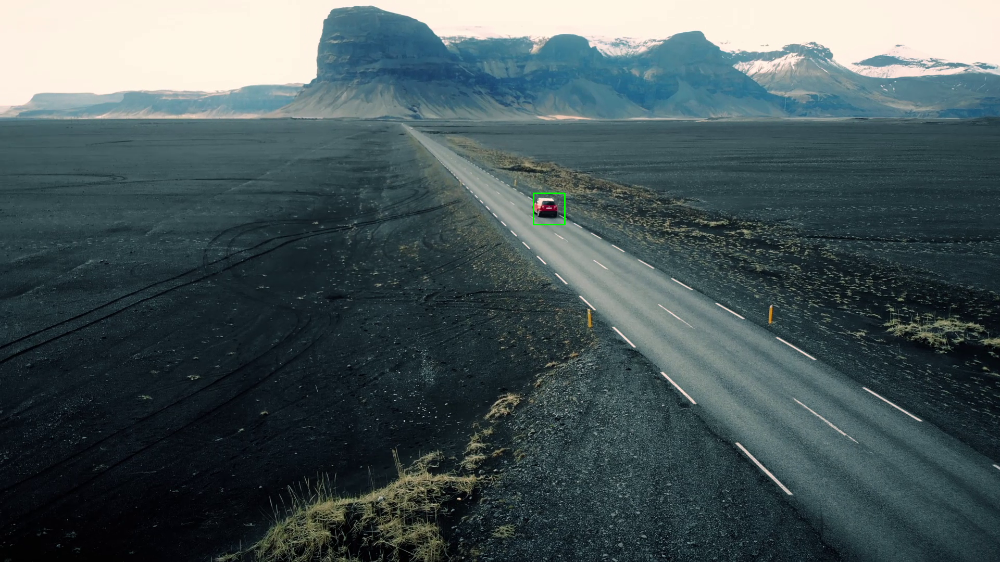

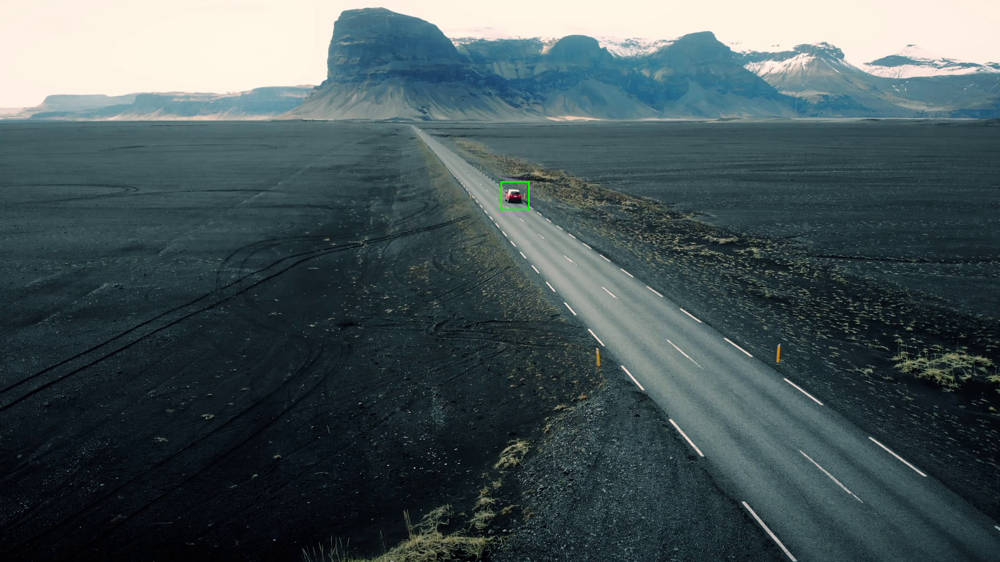

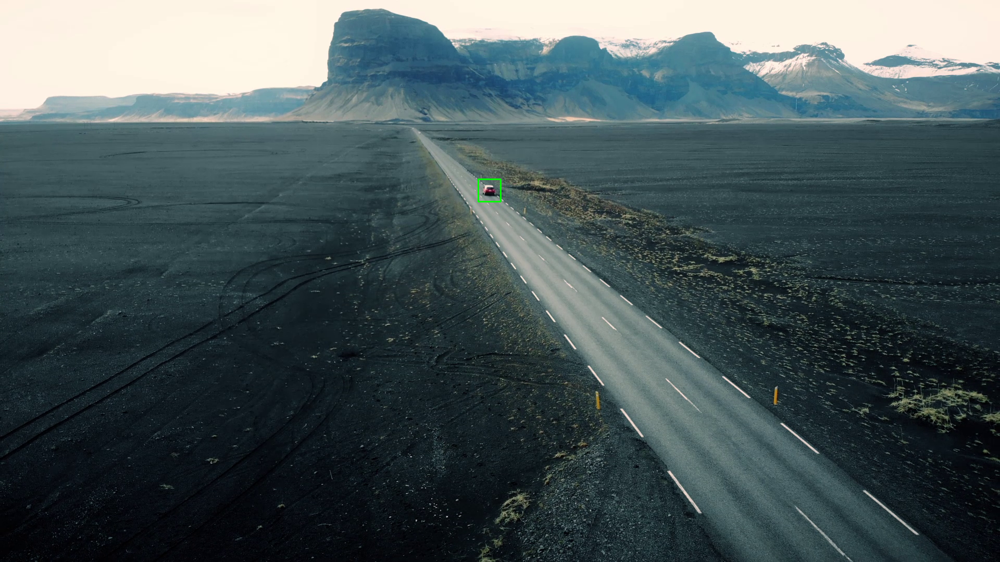

In [14]:
#building a simulator function to load the video, perform vehicle detection and then render a frame with detected vehicles on the screen.
def Simulator():
  count = 0
  CarVideo = cv2.VideoCapture('/content/Ice Car.mp4')
  while CarVideo.isOpened():
    ret, frame = CarVideo.read()
    controlkey = cv2.waitKey(1)
    if ret:
      cars_frame = detect_cars(frame)
      count = count+1
      if count%50 == 0:
        cv2_imshow(cars_frame)
    else:
      break
    if controlkey == ord('q'):
      break

  CarVideo.release()
  cv2.destroyAllWindows()

if __name__ == '__main__':
  Simulator()